In [8]:
# AdvancedGAN - Wesserstein GAN

# importing the libraries
import torch, torchvision, os, PIL, pdb
from torch import nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def show(tensor, num=25, wandbactive=0, name=''):
  data = tensor.detach().cpu()
  grid = make_grid(data[:num], nrow=5).permute(1,2,0)

  ## optional
  if (wandbactive==1):
    wandb.log({name:wandb.Image(grid.numpy().clip(0,1))})

  plt.imshow(grid.clip(0,1))
  plt.show()

### hyperparameters and general parameters
n_epochs=10000
batch_size=128
lr=1e-4
z_dim=200
device='cuda' #GPU

cur_step=0
crit_cycles=5
gen_losses=[]
crit_losses=[]
show_step=35
save_step=35

wandbact=1 # yes, we want to track stats through weights and biases, optional


In [2]:
# !pip install wandb -qqq
import wandb
import os
from dotenv import load_dotenv
load_dotenv()

wandb.login(key=os.getenv("WANDB_API_KEY"))

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: bellmake (bellmake-yonsei-university). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /home/joseph/.netrc


True

In [3]:
%%capture

experiment_name = wandb.util.generate_id() # generate name of the project

myrun=wandb.init(
    project="WessersteinGAN",
    group = experiment_name,
    config={
        "optimizer":"sgd",
        "model":"wgan gp",
        "epoch":"1000",
        "batch_size":128
    }
)

config=wandb.config



In [4]:
print(experiment_name)

a3elpazh


In [9]:
# generator model
# https://medium.com/@ideami

class Generator(nn.Module):
  def __init__(self, z_dim=64, d_dim=16):
    super(Generator, self).__init__()
    self.z_dim=z_dim

    self.gen = nn.Sequential(
            ## ConvTranspose2d: in_channels, out_channels, kernel_size, stride=1, padding=0
            ## Calculating new width and height: (n-1)*stride -2*padding +ks
            ## n = width or height
            ## ks = kernel size
            ## we begin with a 1x1 image with z_dim number of channels (200)
            nn.ConvTranspose2d(z_dim, d_dim * 32, 4, 1, 0), ## 4x4 (ch: 200, 512)
            nn.BatchNorm2d(d_dim*32),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim*32, d_dim*16, 4, 2, 1), ## 8x8 (ch: 512, 256)
            nn.BatchNorm2d(d_dim*16),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim*16, d_dim*8, 4, 2, 1), ## 16x16 (ch: 256, 128)
            #(n-1)*stride -2*padding +ks = (8-1)*2-2*1+4=16
            nn.BatchNorm2d(d_dim*8),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim*8, d_dim*4, 4, 2, 1), ## 32x32 (ch: 128, 64)
            nn.BatchNorm2d(d_dim*4),
            nn.ReLU(True),            

            nn.ConvTranspose2d(d_dim*4, d_dim*2, 4, 2, 1), ## 64x64 (ch: 64, 32)
            nn.BatchNorm2d(d_dim*2),
            nn.ReLU(True),            

            nn.ConvTranspose2d(d_dim*2, 3, 4, 2, 1), ## 128x128 (ch: 32, 3)
            nn.Tanh() ### produce result in the range from -1 to 1
    )


  def forward(self, noise):
    x=noise.view(len(noise), self.z_dim, 1, 1)  # 128 x 200 x 1 x 1
    return self.gen(x)


def gen_noise(num, z_dim, device='cuda'):
   return torch.randn(num, z_dim, device=device) # 128 x 200



In [10]:
## critic model

class Critic(nn.Module):
  def __init__(self, d_dim=16):
    super(Critic, self).__init__()

    self.crit = nn.Sequential(
      # Conv2d: in_channels, out_channels, kernel_size, stride=1, padding=0
      ## New width and height: # (n+2*pad-ks)//stride +1
      nn.Conv2d(3, d_dim, 4, 2, 1), #(n+2*pad-ks)//stride +1 = (128+2*1-4)//2+1=64x64 (ch: 3,16)
      nn.InstanceNorm2d(d_dim), 
      nn.LeakyReLU(0.2),

      nn.Conv2d(d_dim, d_dim*2, 4, 2, 1), ## 32x32 (ch: 16, 32)
      nn.InstanceNorm2d(d_dim*2), 
      nn.LeakyReLU(0.2),

      nn.Conv2d(d_dim*2, d_dim*4, 4, 2, 1), ## 16x16 (ch: 32, 64)
      nn.InstanceNorm2d(d_dim*4), 
      nn.LeakyReLU(0.2),
              
      nn.Conv2d(d_dim*4, d_dim*8, 4, 2, 1), ## 8x8 (ch: 64, 128)
      nn.InstanceNorm2d(d_dim*8), 
      nn.LeakyReLU(0.2),

      nn.Conv2d(d_dim*8, d_dim*16, 4, 2, 1), ## 4x4 (ch: 128, 256)
      nn.InstanceNorm2d(d_dim*16), 
      nn.LeakyReLU(0.2),

      nn.Conv2d(d_dim*16, 1, 4, 1, 0), #(n+2*pad-ks)//stride +1=(4+2*0-4)//1+1= 1X1 (ch: 256,1)

    )


  def forward(self, image):
    # image: 128 x 3 x 128 x 128
    crit_pred = self.crit(image) # 128 x 1 x 1 x 1
    return crit_pred.view(len(crit_pred),-1) ## 128 x 1  
  

In [7]:
## optional, init your weights in different ways
def init_weights(m):
    if isinstance(m, nn.Conv2d) or isinstance(m,nn.ConvTranspose2d):
      torch.nn.init.normal_(m.weight, 0.0, 0.02)
      torch.nn.init.constant_(m.bias,0)

    if isinstance(m,nn.BatchNorm2d):
      torch.nn.init.normal_(m.weight, 0.0, 0.02)
      torch.nn.init.constant_(m.bias,0)


##gen=gen.apply(init_weights)

In [9]:
# # load dataset
import zipfile

path='./data/celeba'
download_path=f'{path}/img_align_celeba.zip'

if not os.path.exists(path):
  os.makedirs(path)

!curl -L -o download_path\
https://www.kaggle.com/api/v1/datasets/download/jessicali9530/celeba-dataset

with zipfile.ZipFile(download_path, 'r') as ziphandler:
  ziphandler.extractall(path)

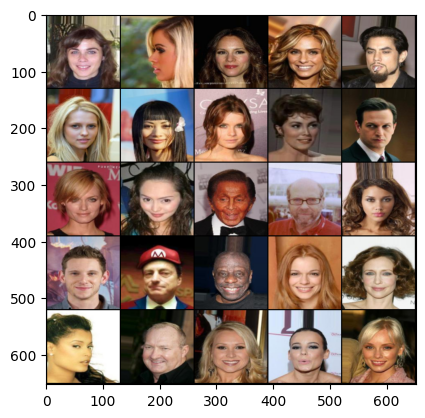

In [10]:
### Dataset, DataLoader, declare gen,crit, test dataset

class Dataset(Dataset):
  def __init__(self, path, size=128, lim=10000):
    self.sizes=[size, size]
    items, labels=[],[]

    for data in os.listdir(path)[:lim]:
      #path: './data/celeba/img_align_celeba'
      #data: '114568.jpg
      item = os.path.join(path,data)
      items.append(item)
      labels.append(data)
    self.items=items
    self.labels=labels


  def __len__(self):
    return len(self.items)

  def __getitem__(self,idx):
    data = PIL.Image.open(self.items[idx]).convert('RGB') # (178,218)
    data = np.asarray(torchvision.transforms.Resize(self.sizes)(data)) # 128 x 128 x 3
    data = np.transpose(data, (2,0,1)).astype(np.float32, copy=False) # 3 x 128 x 128 # from 0 to 255
    data = torch.from_numpy(data).div(255) # from 0 to 1
    return data, self.labels[idx]

## Dataset
data_path='./data/celeba/img_align_celeba'
ds = Dataset(data_path, size=128, lim=10000)

## DataLoader
dataloader = DataLoader(ds, batch_size=batch_size, shuffle=True)

## Models
gen = Generator(z_dim).to(device)
crit = Critic().to(device)

## Optimizers
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(0.5,0.9))
crit_opt= torch.optim.Adam(crit.parameters(), lr=lr, betas=(0.5,0.9))

## Initializations
##gen=gen.apply(init_weights)
##crit=crit.apply(init_weights)

#wandb optional
if (wandbact==1):
  wandb.watch(gen, log_freq=100)
  wandb.watch(crit, log_freq=100)

x,y=next(iter(dataloader))
show(x)


In [11]:
## gradient penalty calculation

def get_gp(real, fake, crit, alpha, gamma=10):
  mix_images = real * alpha + fake * (1-alpha) # 128 x 3 x 128 x 128
  mix_scores = crit(mix_images) # 128 x 1

  gradient = torch.autograd.grad(
      inputs = mix_images,
      outputs = mix_scores,
      grad_outputs=torch.ones_like(mix_scores),
      retain_graph=True,
      create_graph=True,
  )[0] # 128 x 3 x 128 x 128

  gradient = gradient.view(len(gradient), -1)   # 128 x 49152
  gradient_norm = gradient.norm(2, dim=1) 
  gp = gamma * ((gradient_norm-1)**2).mean()

  return gp



In [12]:
## Save and load checkpoints

root_path='./data/'

def save_checkpoint(name):
  torch.save({
      'epoch': epoch,
      'model_state_dict': gen.state_dict(),
      'optimizer_state_dict': gen_opt.state_dict()      
  }, f"{root_path}G-{name}.pkl")

  torch.save({
      'epoch': epoch,
      'model_state_dict': crit.state_dict(),
      'optimizer_state_dict': crit_opt.state_dict()      
  }, f"{root_path}C-{name}.pkl")
  
  print("Saved checkpoint")

def load_checkpoint(name):
  checkpoint = torch.load(f"{root_path}G-{name}.pkl")
  gen.load_state_dict(checkpoint['model_state_dict'])
  gen_opt.load_state_dict(checkpoint['optimizer_state_dict'])

  checkpoint = torch.load(f"{root_path}C-{name}.pkl")
  crit.load_state_dict(checkpoint['model_state_dict'])
  crit_opt.load_state_dict(checkpoint['optimizer_state_dict'])

  print("Loaded checkpoint")

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  35 35
Saved checkpoint


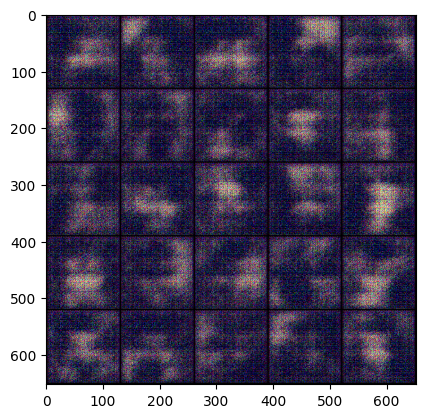

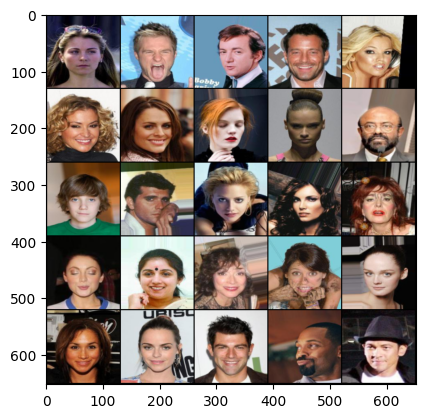

Epoch: 0: Step 35: Generator loss: 10.390005773944514, critic loss: -11.392248449666162


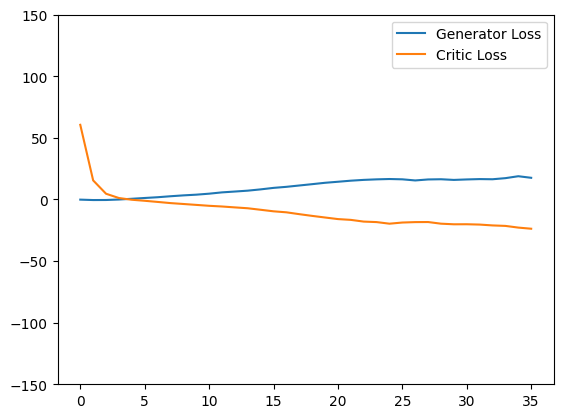

Saving checkpoint:  70 35
Saved checkpoint


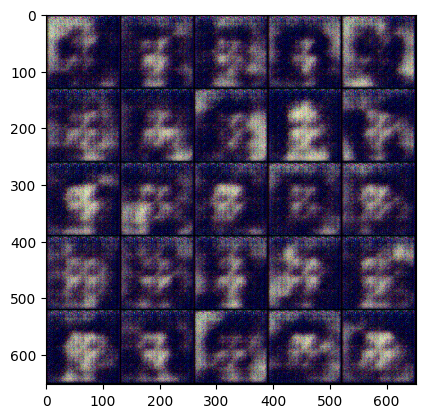

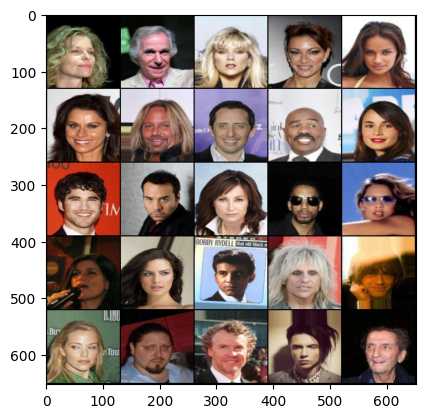

Epoch: 0: Step 70: Generator loss: 28.67961823599679, critic loss: -34.16708938598633


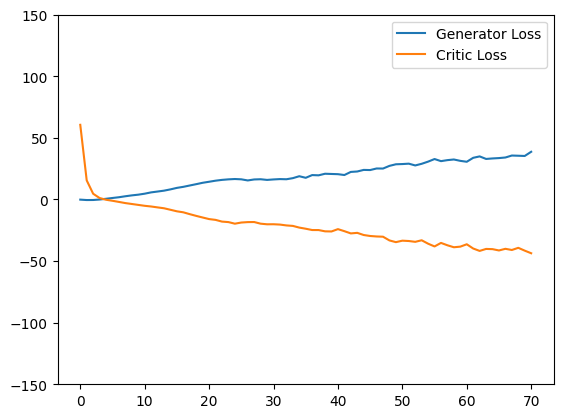

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  105 35
Saved checkpoint


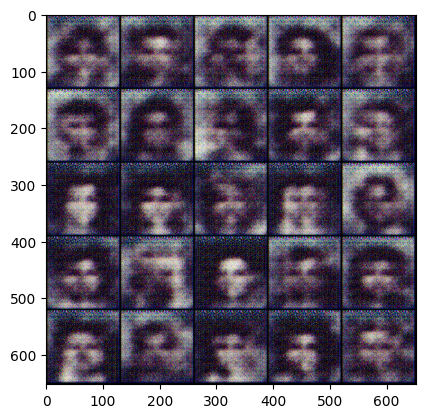

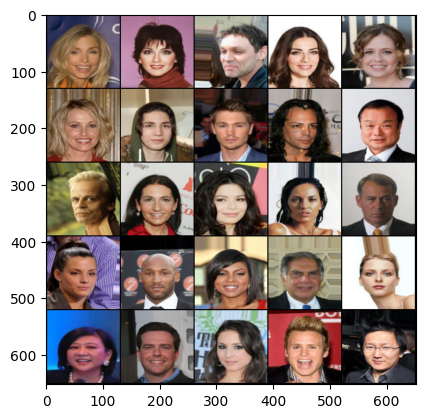

Epoch: 1: Step 105: Generator loss: 39.77656707763672, critic loss: -44.83900541033064


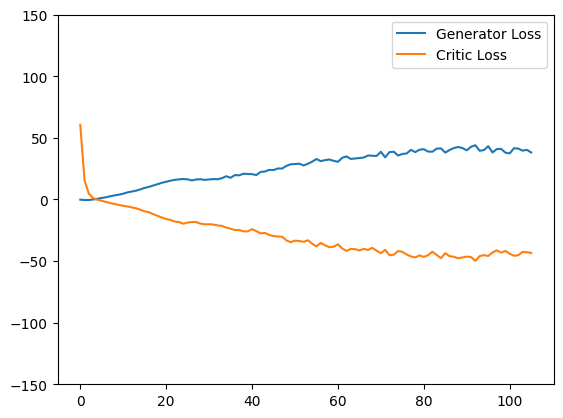

Saving checkpoint:  140 35
Saved checkpoint


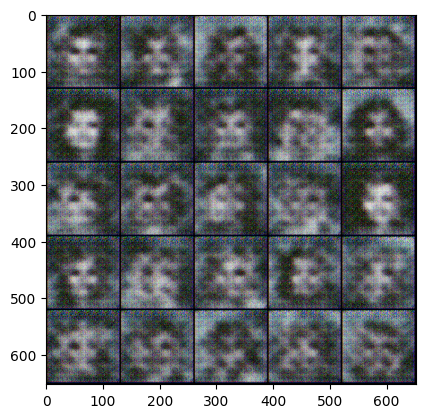

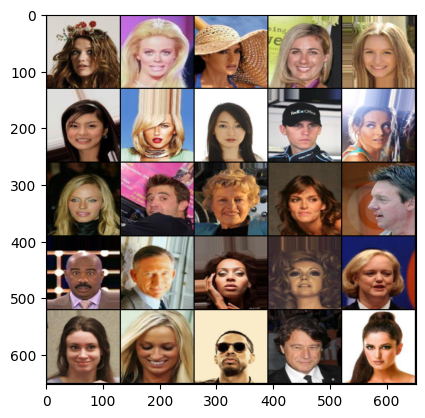

Epoch: 1: Step 140: Generator loss: 32.35386020115444, critic loss: -35.23939480372838


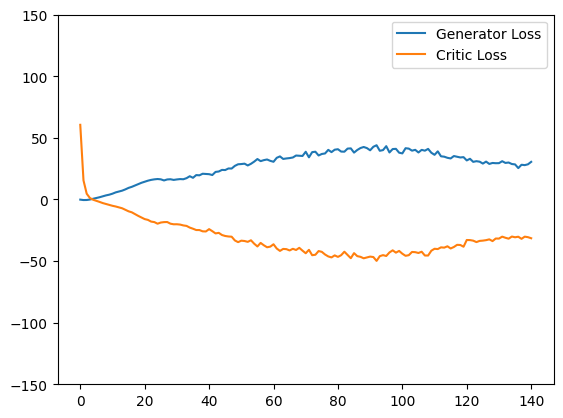

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  175 35
Saved checkpoint


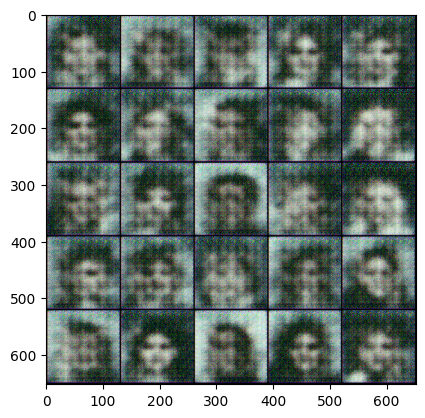

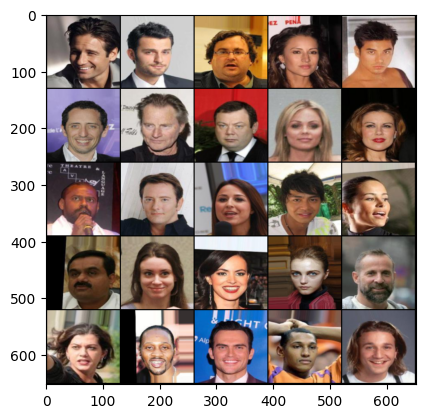

Epoch: 2: Step 175: Generator loss: 26.70104784284319, critic loss: -27.020679381234302


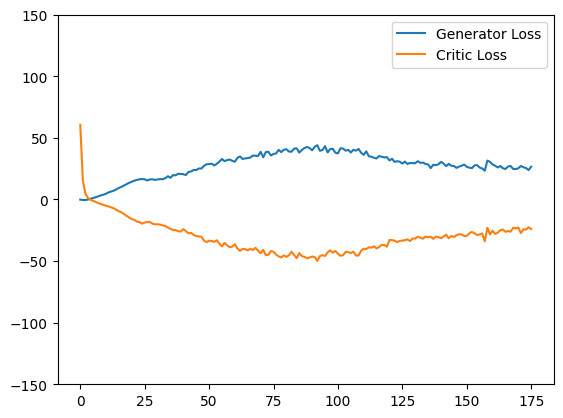

Saving checkpoint:  210 35
Saved checkpoint


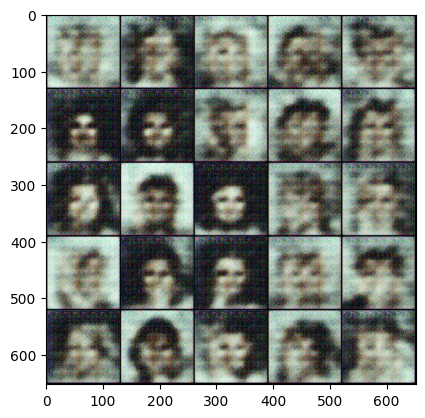

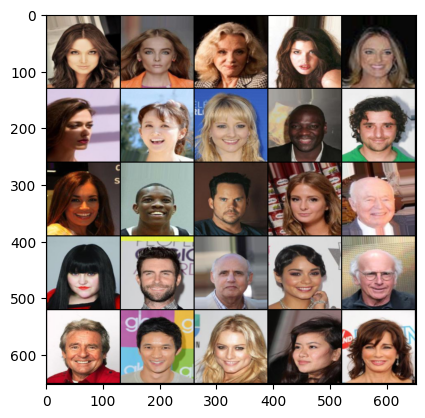

Epoch: 2: Step 210: Generator loss: 24.682426398141043, critic loss: -21.63465144021171


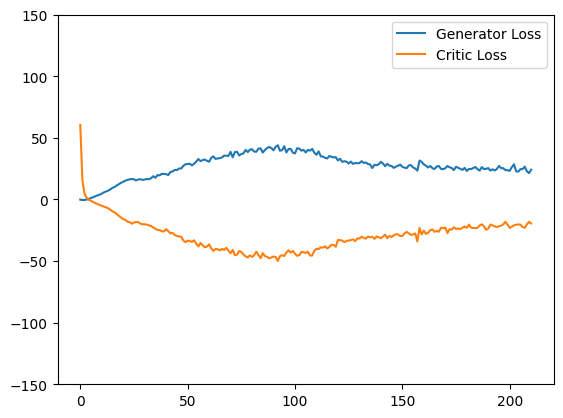

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  245 35
Saved checkpoint


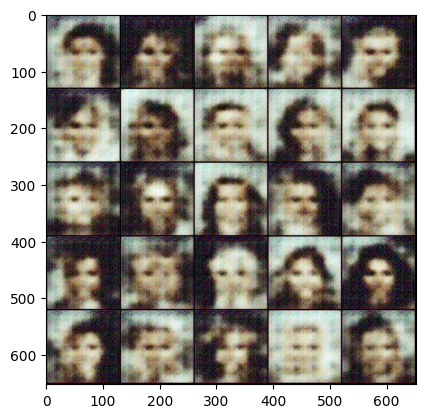

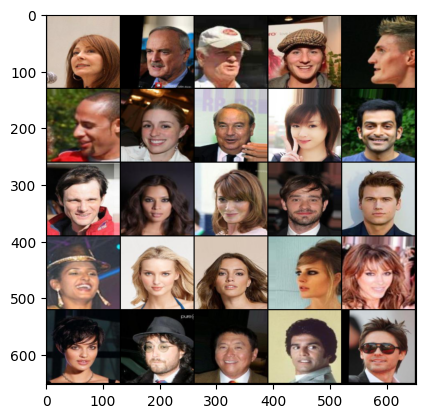

Epoch: 3: Step 245: Generator loss: 23.826588330950056, critic loss: -19.28296883719308


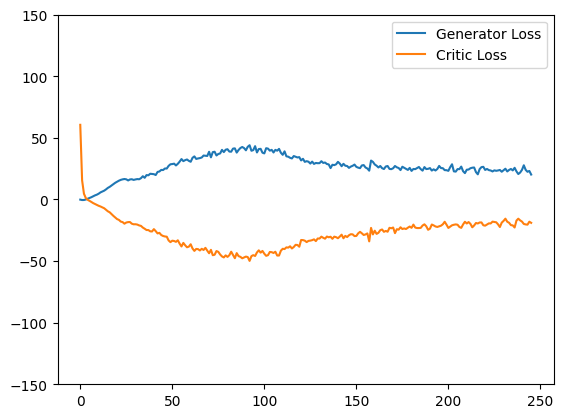

Saving checkpoint:  280 35
Saved checkpoint


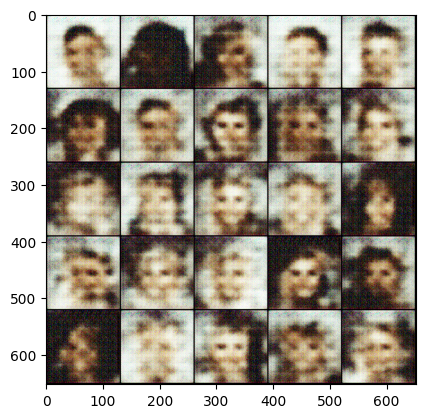

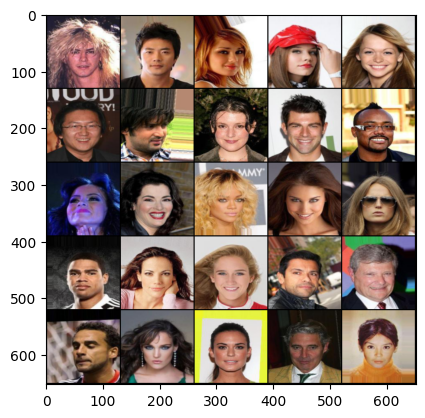

Epoch: 3: Step 280: Generator loss: 23.23879122052874, critic loss: -17.101011194501606


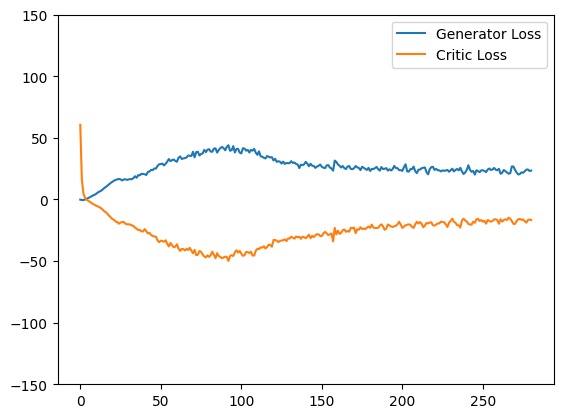

Saving checkpoint:  315 35
Saved checkpoint


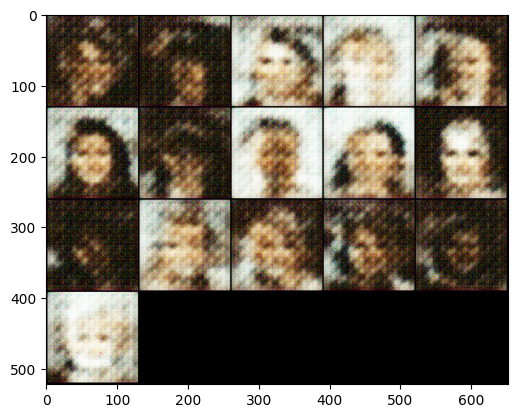

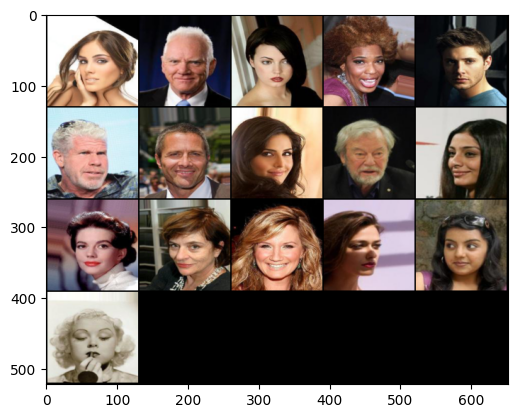

Epoch: 3: Step 315: Generator loss: 23.398500987461635, critic loss: -16.566255574907576


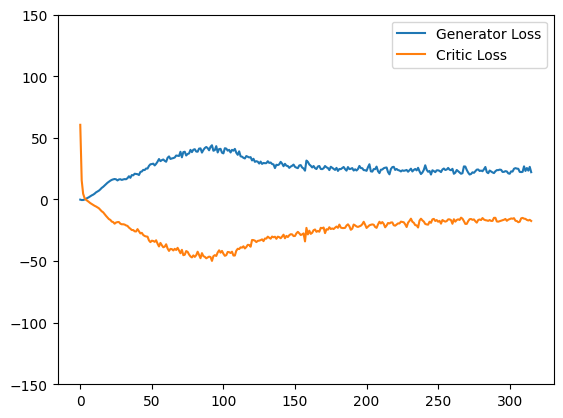

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  350 35
Saved checkpoint


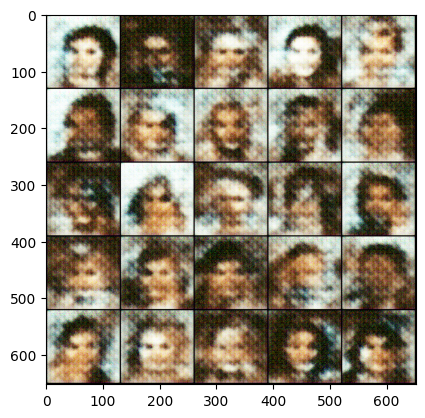

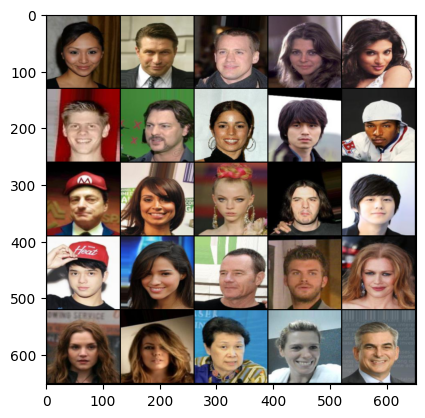

Epoch: 4: Step 350: Generator loss: 22.943961606706893, critic loss: -15.330361507960726


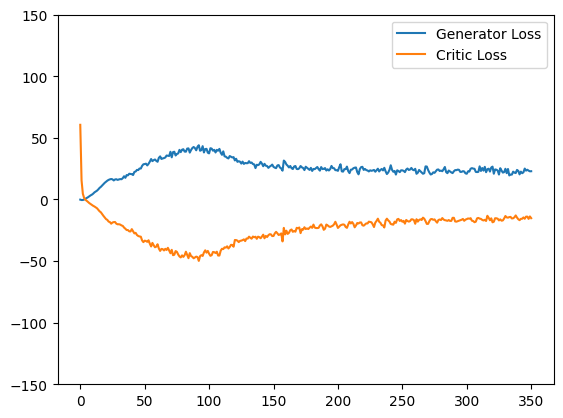

Saving checkpoint:  385 35
Saved checkpoint


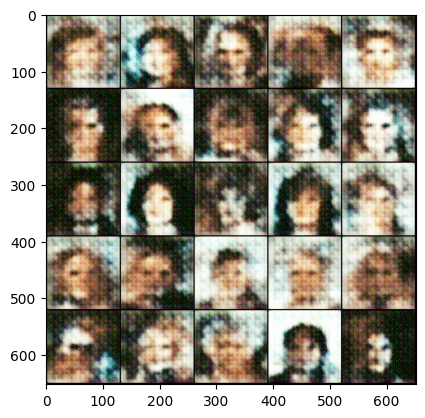

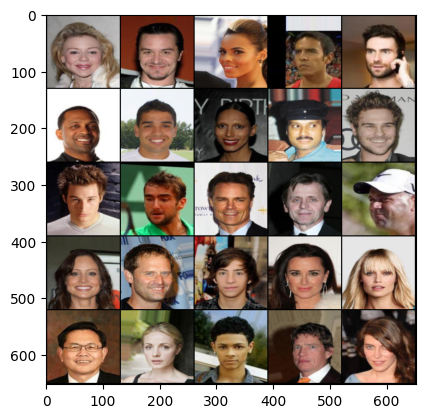

Epoch: 4: Step 385: Generator loss: 22.337298474993023, critic loss: -14.771318141392298


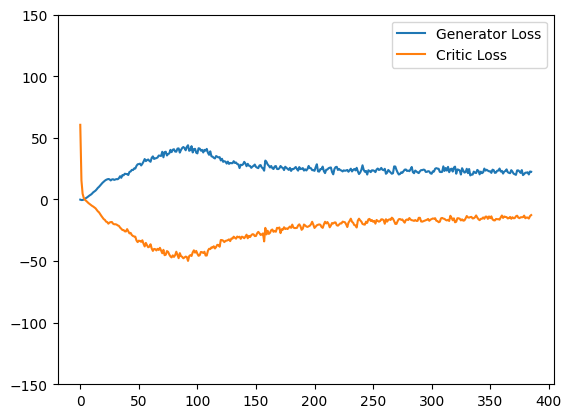

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  420 35
Saved checkpoint


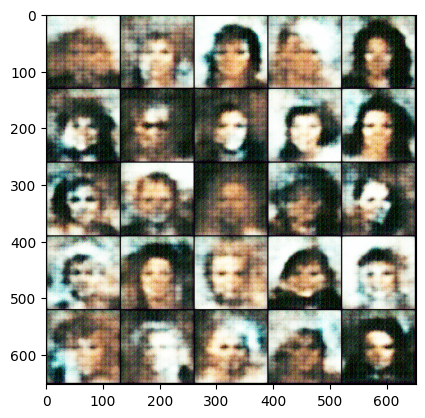

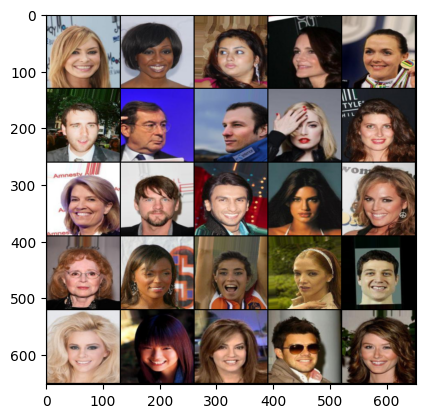

Epoch: 5: Step 420: Generator loss: 21.68348922729492, critic loss: -13.946328135899135


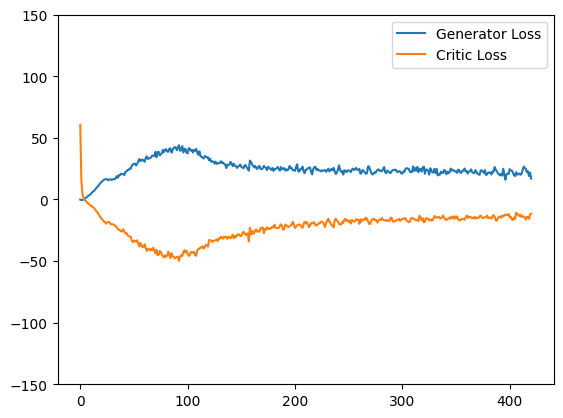

Saving checkpoint:  455 35
Saved checkpoint


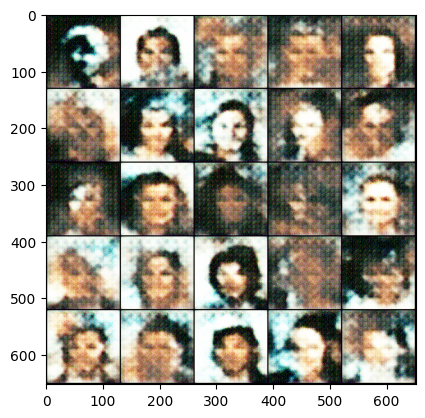

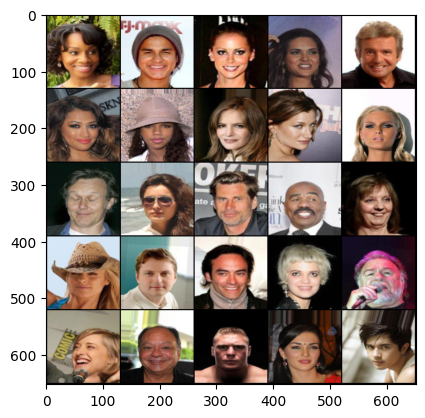

Epoch: 5: Step 455: Generator loss: 19.269834409441266, critic loss: -13.075529452732633


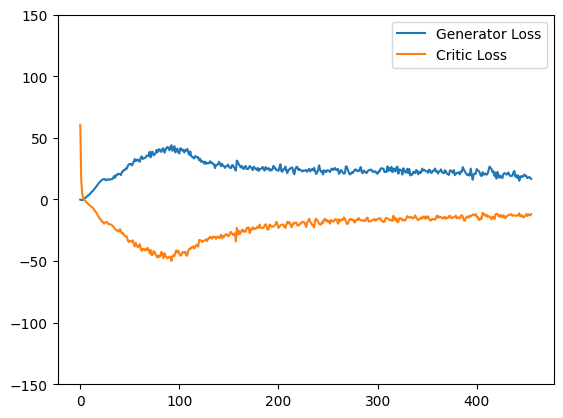

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  490 35
Saved checkpoint


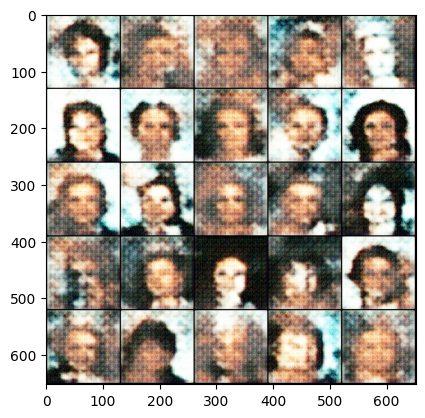

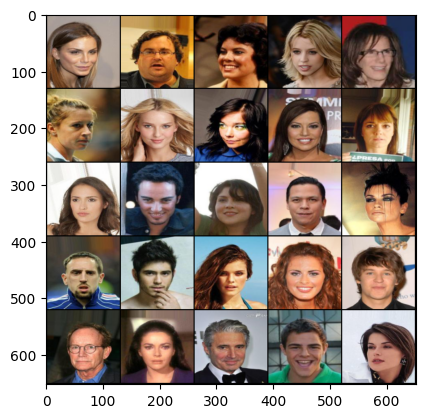

Epoch: 6: Step 490: Generator loss: 17.79969948359898, critic loss: -12.346879422324044


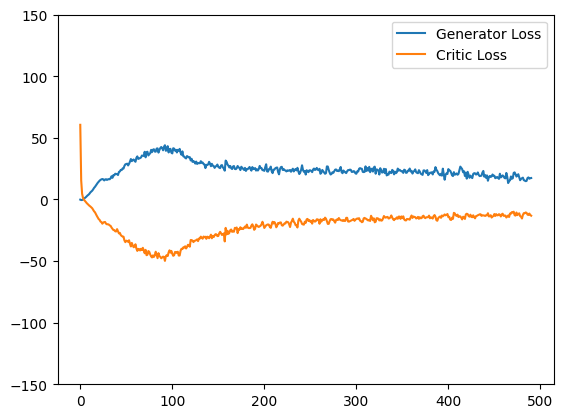

In [ ]:
## Training loop 

for epoch in range(n_epochs):
  for real, _ in tqdm(dataloader):
    cur_bs= len(real) #128
    real=real.to(device)

    ### CRITIC
    mean_crit_loss = 0
    for _ in range(crit_cycles):
      crit_opt.zero_grad()

      noise=gen_noise(cur_bs, z_dim)
      fake = gen(noise)
      crit_fake_pred = crit(fake.detach())
      crit_real_pred = crit(real)

      alpha=torch.rand(len(real),1,1,1,device=device, requires_grad=True) # 128 x 1 x 1 x 1
      gp = get_gp(real, fake.detach(), crit, alpha)

      crit_loss = crit_fake_pred.mean() - crit_real_pred.mean() + gp

      mean_crit_loss+=crit_loss.item() / crit_cycles

      crit_loss.backward(retain_graph=True)
      crit_opt.step()

    crit_losses+=[mean_crit_loss]

    ### GENERATOR
    gen_opt.zero_grad()
    noise = gen_noise(cur_bs, z_dim)
    fake = gen(noise)
    crit_fake_pred = crit(fake)

    gen_loss = -crit_fake_pred.mean()
    gen_loss.backward()
    gen_opt.step()

    gen_losses+=[gen_loss.item()]

    ### Stats  
   
    if (wandbact==1):
      wandb.log({'Epoch': epoch, 'Step': cur_step, 'Critic loss':mean_crit_loss, 'Gen loss': gen_loss})

    if cur_step % save_step == 0 and cur_step > 0:
      print("Saving checkpoint: ", cur_step, save_step)
      save_checkpoint("latest")

    if (cur_step % show_step == 0 and cur_step > 0):
      show(fake, wandbactive=1, name='fake')
      show(real, wandbactive=1, name='real')

      gen_mean=sum(gen_losses[-show_step:]) / show_step
      crit_mean = sum(crit_losses[-show_step:]) / show_step
      print(f"Epoch: {epoch}: Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")

      plt.plot(
          range(len(gen_losses)),
          torch.Tensor(gen_losses),
          label="Generator Loss"
      )

      plt.plot(
          range(len(gen_losses)),
          torch.Tensor(crit_losses),
          label="Critic Loss"
      )

      plt.ylim(-150,150)
      plt.legend()
      plt.show()
    
    cur_step+=1


In [ ]:
# number of steps per epoch
# 10000 / 128 = 78.125
# 50000 / 128 = 390.625

In [13]:
# load checkpoint
import torch
import torch.nn as nn
import torch.optim as optim

root_path='./data/'


# 모델 초기화
z_dim = 200
d_dim = 16
gen = Generator(z_dim=z_dim, d_dim=d_dim).cuda()  # Generator 모델
crit = Critic(d_dim=d_dim).cuda()                # Critic 모델

# 옵티마이저 초기화
gen_opt = optim.Adam(gen.parameters(), lr=0.001)
crit_opt = optim.Adam(crit.parameters(), lr=0.001)
epoch = 0  # 시작 epoch 설정

# 체크포인트 로드
def load_checkpoint(name):
    checkpoint = torch.load(f"{root_path}G-{name}.pkl")
    gen.load_state_dict(checkpoint['model_state_dict'])
    gen_opt.load_state_dict(checkpoint['optimizer_state_dict'])

    checkpoint = torch.load(f"{root_path}C-{name}.pkl")
    crit.load_state_dict(checkpoint['model_state_dict'])
    crit_opt.load_state_dict(checkpoint['optimizer_state_dict'])

    print("체크포인트 로드 완료")

# 사용 예시
name = "latest"  # 체크포인트 이름
load_checkpoint(name)  # 저장된 상태 로드


체크포인트 로드 완료


/tmp/ipykernel_5874/2948806446.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(f"{root_path}G-{name}.pkl")
/tmp/ipykernel_5874/2948806446.py:26:

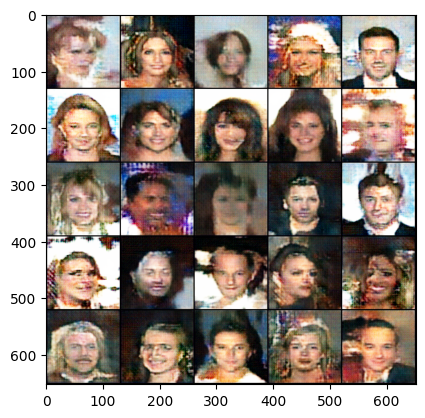

In [14]:
#### Generate new faces
noise = gen_noise(batch_size, z_dim)
fake = gen(noise)
show(fake)

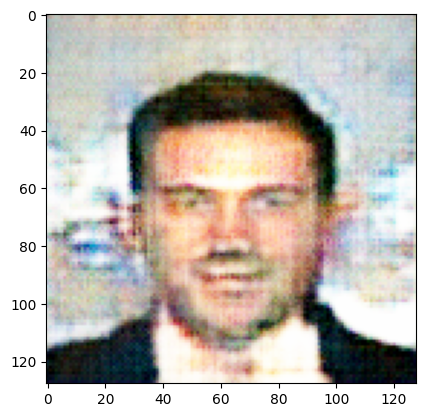

In [19]:
plt.imshow(fake[4].detach().cpu().permute(1,2,0).squeeze().clip(0,1))

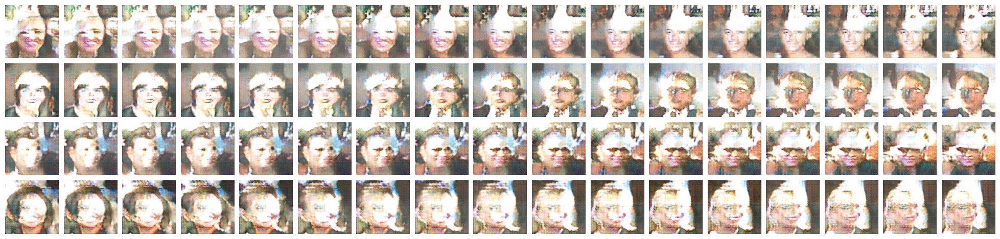

In [20]:
from mpl_toolkits.axes_grid1 import ImageGrid

# # MORPHING, interpolation between points in latent space
gen_set = []
z_shape = [1,200,1,1] # 1 batch, 200 latent dim, 1x1 (size of image)
rows = 4
steps= 17

for i in range(rows):
    z1, z2 = torch.randn(z_shape), torch.randn(z_shape)
    
    for alpha in np.linspace(0,1,steps):
        z = alpha*z1 + (1-alpha)*z2
        res = gen(z.cuda())[0]
        gen_set.append(res)
        
fig = plt.figure(figsize=(25,11))
grid = ImageGrid(fig, 111, nrows_ncols=(rows,steps), axes_pad=0.1)


for ax, img in zip (grid, gen_set):
    ax.axis('off')
    res=img.cpu().detach().permute(1,2,0)
    res=res-res.min() # remove negative values
    res=res/(res.max()-res.min()) # normalizing
    ax.imshow(res)

plt.show()